# Chroma Vector Database Tutorial

빠른 이미지 검색을 위한 벡터 데이터베이스 튜토리얼

In [1]:
!pip install -q chromadb transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.2/284.2 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.8/65.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.2/196.2 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.4/118.4 kB 6.0 MB/s eta 0:0

## Dataset

Food-11 데이터셋 중 evaluation 데이터 10장씩

https://www.kaggle.com/datasets/trolukovich/food11-image-dataset

In [2]:
!wget -q https://github.com/kairess/toy-datasets/raw/master/Food-11.zip
!unzip -q Food-11.zip

In [71]:
!unzip -q archive.zip

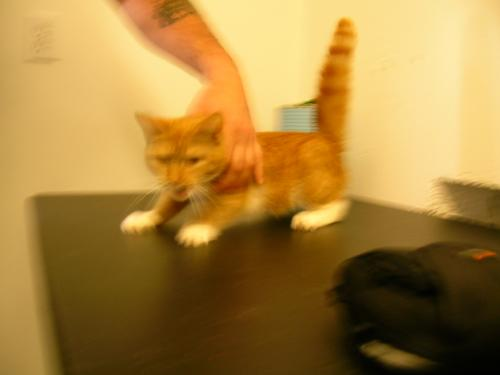

In [72]:
from PIL import Image

img = Image.open("/content/test/Cat/0.jpg")

img

## Image Vectorizer 모델 로드

https://huggingface.co/facebook/dino-vits16

In [73]:
from transformers import ViTFeatureExtractor, ViTModel

feature_extractor = ViTFeatureExtractor.from_pretrained('facebook/dino-vits16')
model = ViTModel.from_pretrained('facebook/dino-vits16').to("cuda")

print("Models loaded!")

/usr/local/lib/python3.11/dist-packages/transformers/models/vit/feature_extraction_vit.py:30: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vits16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Models loaded!


## 임베딩

In [74]:
img_tensor = feature_extractor(images=img, return_tensors="pt").to("cuda")
outputs = model(**img_tensor)

embedding = outputs.pooler_output.detach().cpu().numpy().squeeze()

embedding

array([ 8.6655462e-01,  8.7578803e-01, -9.9979258e-01, -1.7972620e-02,
        7.6047730e-01, -8.6163527e-01,  7.0193076e-01, -9.4000787e-01,
        7.0892483e-02, -8.6265922e-01,  8.0078852e-01,  9.8834395e-01,
        5.9910810e-01,  7.1613377e-01,  7.5908780e-01, -9.1888177e-01,
        9.9164021e-01, -9.9928600e-01, -6.0541499e-01, -9.8225105e-01,
       -8.1681246e-01, -9.7942358e-01, -8.4381807e-01, -8.6986309e-01,
       -9.8986238e-01, -9.9941325e-01,  8.2409251e-01, -3.2987840e-02,
       -9.9910796e-01, -9.8856455e-01,  9.7109014e-01, -5.0935268e-01,
       -3.9076173e-01, -9.9324244e-01, -4.8547652e-01, -6.1952543e-01,
       -3.1156808e-01, -9.9832273e-01, -9.6523154e-01,  1.0797633e-01,
        2.2888359e-02,  9.1048557e-01,  4.7763032e-01, -2.5439912e-01,
        9.8197091e-01, -8.5987842e-01,  3.2505053e-01,  9.4832438e-01,
       -9.9973935e-01, -9.6305794e-01,  4.1395113e-01,  9.1275036e-01,
       -8.0245864e-01, -4.5239145e-01,  8.3903626e-02, -9.4056892e-01,
      

In [75]:
embedding.shape

(384,)

## Chroma DB 시작

https://www.trychroma.com

In [77]:
import chromadb

# ChromaDB 클라이언트 초기화
# 기본적으로 로컬에 저장된 데이터베이스에 연결됩니다.
# (이전에 생성된 데이터가 있다면 그 데이터를 사용합니다.)
client = chromadb.Client()

print("ChromaDB에 존재하는 컬렉션 목록:")

try:
    # 모든 컬렉션 가져오기
    collections = client.list_collections()

    if collections:
        for collection in collections:
            print(f"- 컬렉션 이름: {collection.name}")
            # 컬렉션에 대한 추가 정보가 필요하면 metadata 등도 출력 가능
            # print(f"  ID: {collection.id}")
            # print(f"  메타데이터: {collection.metadata}")
            # print(f"  개수: {collection.count()}") # 컬렉션 내 임베딩 개수
    else:
        print("현재 ChromaDB에 컬렉션이 존재하지 않습니다.")

except Exception as e:
    print(f"컬렉션 목록을 가져오는 중 오류 발생: {e}")

ChromaDB에 존재하는 컬렉션 목록:
- 컬렉션 이름: foods
- 컬렉션 이름: meat
- 컬렉션 이름: noodles-pasta
- 컬렉션 이름: pet
- 컬렉션 이름: cat
- 컬렉션 이름: soup


In [76]:
import chromadb

client = chromadb.Client()

collection = client.create_collection("pet")

## 모든 이미지 벡터화

In [89]:
from glob import glob

img_list = sorted(glob("test/*/*.jpg"))

len(img_list)

25109

In [92]:
import os
from tqdm import tqdm
from PIL import Image
import numpy as np # 혹시 모를 경우를 대비하여 numpy 임포트

embeddings = []
metadatas = []
ids = []

for i, img_path in enumerate(tqdm(img_list)):
    img = Image.open(img_path)

    # 이미지 모드 확인 및 필요시 RGB로 변환 (이전 대화에서 발생한 'ValueError' 방지)
    if img.mode != 'RGB':
        img = img.convert('RGB')

    # 이미지 경로에서 클래스 이름(cls) 추출 (예시: 'dataset_root/class_name/image.jpg'에서 class_name 추출)
    # img_path가 "경로/클래스이름/이미지파일.확장자" 형식이라고 가정합니다.
    # 운영체제에 따라 경로 구분자가 '\'일 수도 있으므로 os.path.basename과 os.path.dirname을 활용하는 것이 더 안전합니다.
    try:
        # 먼저 파일명 제거
        dir_name = os.path.dirname(img_path)
        # 마지막 디렉토리 이름(클래스 이름) 추출
        cls = os.path.basename(dir_name)
    except Exception as e:
        print(f"경로에서 클래스 이름을 추출하는 데 실패했습니다: {img_path}. 오류: {e}")
        cls = "unknown_class" # 오류 발생 시 기본값 설정 또는 건너뛰기

    img_tensor = feature_extractor(images=img, return_tensors="pt").to("cuda")
    outputs = model(**img_tensor)

    embedding = outputs.pooler_output.detach().cpu().numpy().squeeze()
    embedding_to_list = embedding.tolist()

    embeddings.append(embedding_to_list)

    metadatas.append({
        "uri": img_path,
        "name": cls
    })

    ids.append(str(i))

print("Done!")

 95%|█████████▌| 23964/25109 [06:13<00:16, 68.74it/s]/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))
100%|██████████| 25109/25109 [06:31<00:00, 64.17it/s]

Done!


## 임베딩을 데이터베이스에 저장

In [94]:
import os
from tqdm import tqdm
from PIL import Image
import numpy as np

embeddings = []
metadatas = []
ids = []

# 기존 이미지 처리 및 임베딩 생성 루프 (동일)
for i, img_path in enumerate(tqdm(img_list)):
    img = Image.open(img_path)

    if img.mode != 'RGB':
        img = img.convert('RGB')

    try:
        dir_name = os.path.dirname(img_path)
        cls = os.path.basename(dir_name)
    except Exception as e:
        print(f"경로에서 클래스 이름을 추출하는 데 실패했습니다: {img_path}. 오류: {e}")
        cls = "unknown_class"

    img_tensor = feature_extractor(images=img, return_tensors="pt").to("cuda")
    outputs = model(**img_tensor)

    embedding = outputs.pooler_output.detach().cpu().numpy().squeeze()
    embedding_to_list = embedding.tolist()

    embeddings.append(embedding_to_list)

    metadatas.append({
        "uri": img_path,
        "name": cls
    })

    ids.append(str(i))

print("이미지 처리 및 임베딩 생성 완료!")

# ChromaDB에 임베딩을 배치로 추가
BATCH_SIZE = 5000 # ChromaDB의 max_batch_size보다 작은 값으로 설정 (예: 5461보다 작게)
                  # 보통 5000 또는 10000 정도를 많이 사용합니다.
                  # 정확한 max_batch_size는 ChromaDB 버전에 따라 다를 수 있으므로,
                  # 오류 메시지에서 언급된 5461보다 작은 값으로 설정하는 것이 안전합니다.

print(f"총 {len(embeddings)}개의 임베딩을 {BATCH_SIZE}개씩 배치로 ChromaDB에 추가합니다.")

for i in tqdm(range(0, len(embeddings), BATCH_SIZE), desc="ChromaDB에 임베딩 추가"):
    batch_embeddings = embeddings[i:i + BATCH_SIZE]
    batch_metadatas = metadatas[i:i + BATCH_SIZE]
    batch_ids = ids[i:i + BATCH_SIZE]

    try:
        collection.add(
            embeddings=batch_embeddings,
            metadatas=batch_metadatas,
            ids=batch_ids,
        )
    except Exception as e:
        print(f"ChromaDB에 배치 추가 중 오류 발생 (시작 인덱스: {i}): {e}")
        # 오류 발생 시 로깅하거나 재시도 로직을 추가할 수 있습니다.
        break # 일단 오류 발생 시 루프를 중단하도록 설정

print("Done!")

100%|██████████| 25109/25109 [06:29<00:00, 64.48it/s]


이미지 처리 및 임베딩 생성 완료!
총 25109개의 임베딩을 5000개씩 배치로 ChromaDB에 추가합니다.


ChromaDB에 임베딩 추가: 100%|██████████| 6/6 [00:12<00:00,  2.02s/it]

Done!


## Test1

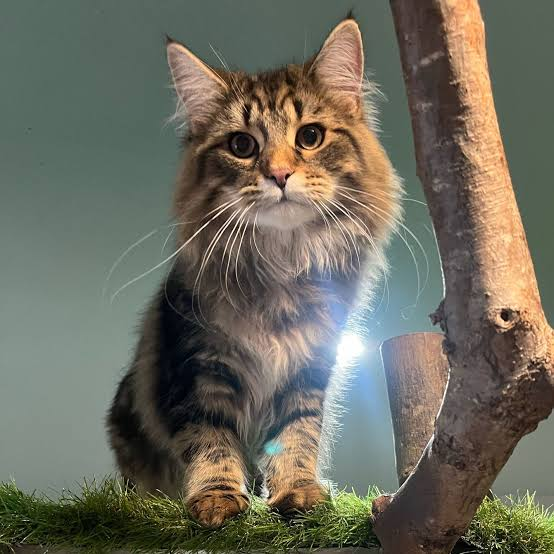

In [95]:
import requests

test_img = Image.open(requests.get("https://encrypted-tbn2.gstatic.com/images?q=tbn:ANd9GcT7beRZPECnd0ZcGF30eyOoElSrcbIBUh9kEjzJrJtVW9liwNROEH3wEuAD5Sp_fzIDSQWmuoMU_Y58wql0_gfRjQ", stream=True).raw).convert("RGB")

test_img

In [96]:
test_img_tensor = feature_extractor(images=test_img, return_tensors="pt").to("cuda")
test_outputs = model(**test_img_tensor)

test_embedding = test_outputs.pooler_output.detach().cpu().numpy().squeeze()
test_embedding_list = test_embedding.tolist()

test_embedding.shape

(384,)

In [97]:
query_result = collection.query(
    query_embeddings=[test_embedding_list],
    n_results=3,
)

query_result

{'ids': [['8766', '10830', '10327']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'name': 'Cat', 'uri': 'test/Cat/6629.jpg'},
   {'uri': 'test/Cat/8488.jpg', 'name': 'Cat'},
   {'uri': 'test/Cat/8034.jpg', 'name': 'Cat'}]],
 'distances': [[83.53767395019531, 88.84273529052734, 93.37828826904297]]}

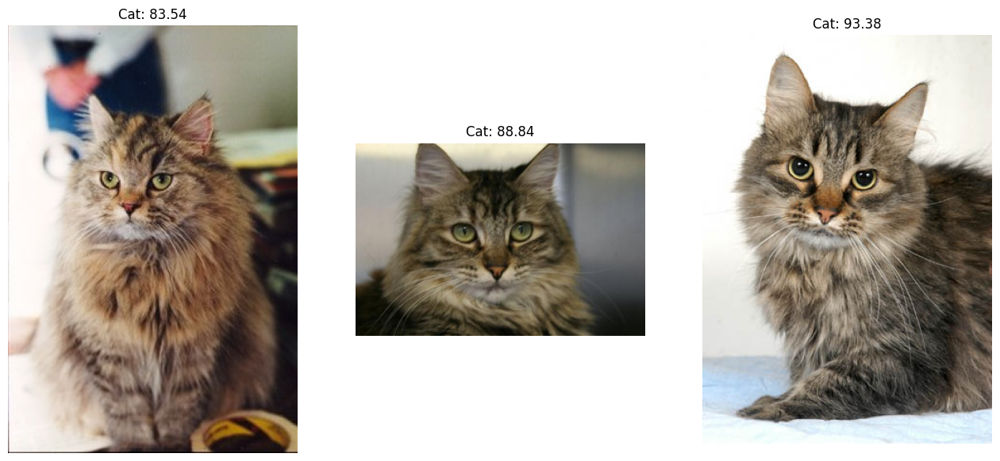

In [98]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(16, 10))

for i, metadata in enumerate(query_result["metadatas"][0]):
    distance = query_result["distances"][0][i]

    axes[i].imshow(Image.open(metadata["uri"]))
    axes[i].set_title(f"{metadata['name']}: {distance:.2f}")
    axes[i].axis("off")

## 테스트를 위한 함수화

In [99]:
def query(img_url, n_results=3):
    test_img = Image.open(requests.get(img_url, stream=True).raw).convert("RGB")

    test_img_tensor = feature_extractor(images=test_img, return_tensors="pt").to("cuda")
    test_outputs = model(**test_img_tensor)

    test_embedding = test_outputs.pooler_output.detach().cpu().numpy().squeeze()
    test_embedding_list = test_embedding.tolist()

    query_result = collection.query(
        query_embeddings=[test_embedding_list],
        n_results=n_results,
    )

    fig, axes = plt.subplots(1, 4, figsize=(16, 10))

    axes[0].imshow(test_img)
    axes[0].set_title("Query")
    axes[0].axis("off")

    for i, metadata in enumerate(query_result["metadatas"][0]):
        distance = query_result["distances"][0][i]

        axes[i+1].imshow(Image.open(metadata["uri"]))
        axes[i+1].set_title(f"{metadata['name']}: {distance:.2f}")
        axes[i+1].axis("off")

    return query_result

## Test2

{'ids': [['2739', '8858', '5753']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Cat/12453.jpg', 'name': 'Cat'},
   {'uri': 'test/Cat/6712.jpg', 'name': 'Cat'},
   {'uri': 'test/Cat/3917.jpg', 'name': 'Cat'}]],
 'distances': [[93.03875732421875, 94.30792999267578, 96.2051010131836]]}

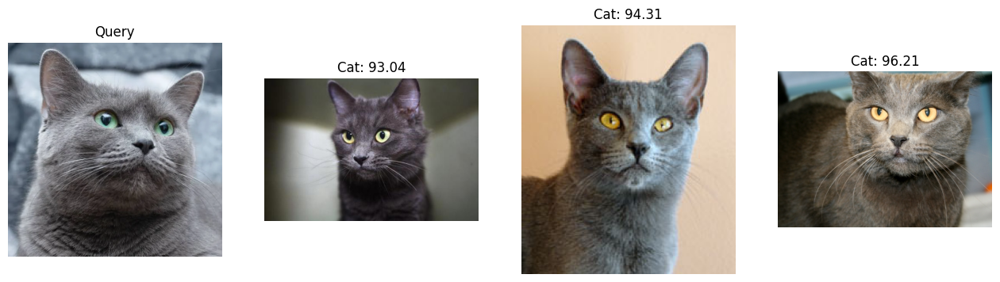

In [100]:
query("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSOHM40mpSU-QlorShORAsIV8MSl9CzAWQehcp0VSpDCgXS771G39O8vGQVxrBDe-YT6H6n03nYwDUyBPI9rO-rgmAJAOlpY1FvAAd1TxxK")

{'ids': [['18', '47', '107']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'name': 'Dairy product', 'uri': 'test/Dairy product/8.jpg'},
   {'name': 'Fried food', 'uri': 'test/Fried food/7.jpg'},
   {'name': 'Vegetable-Fruit', 'uri': 'test/Vegetable-Fruit/7.jpg'}]],
 'distances': [[274.35052490234375, 282.8559875488281, 283.5063781738281]]}

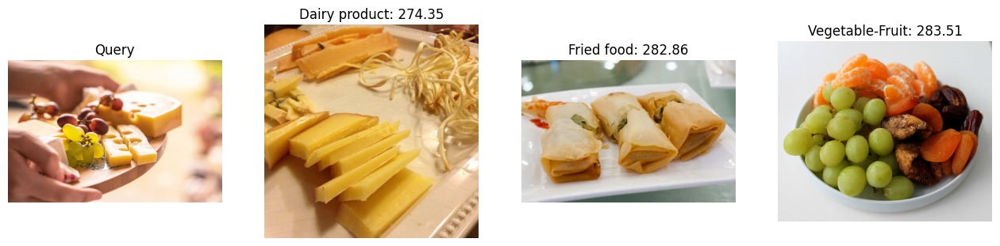

In [18]:
query("https://cdn.pixabay.com/photo/2021/04/05/14/48/cheese-platter-6153716_1280.jpg")

{'ids': [['36', '38', '30']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Egg/6.jpg', 'name': 'Egg'},
   {'uri': 'test/Egg/8.jpg', 'name': 'Egg'},
   {'name': 'Egg', 'uri': 'test/Egg/0.jpg'}]],
 'distances': [[224.60816955566406, 224.8510284423828, 232.29295349121094]]}

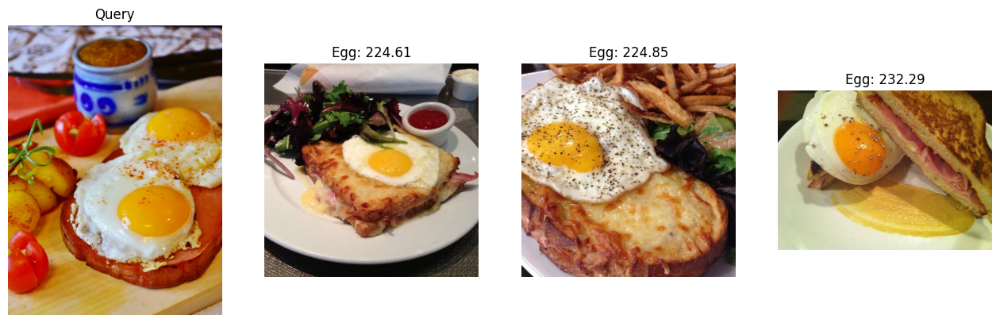

In [41]:
query("https://cdn.pixabay.com/photo/2018/05/17/17/07/fried-3409076_1280.jpg")

{'ids': [['105', '106', '109']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Vegetable-Fruit/5.jpg',
    'name': 'Vegetable-Fruit'},
   {'name': 'Vegetable-Fruit', 'uri': 'test/Vegetable-Fruit/6.jpg'},
   {'name': 'Vegetable-Fruit', 'uri': 'test/Vegetable-Fruit/9.jpg'}]],
 'distances': [[168.21603393554688, 255.62380981445312, 256.25299072265625]]}

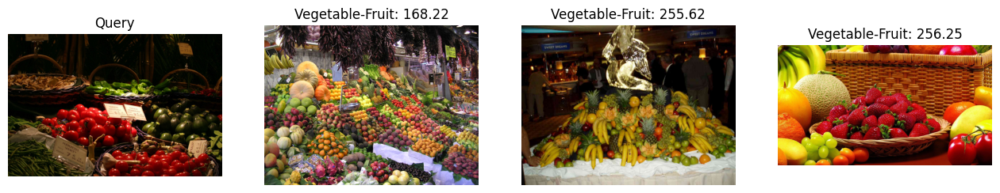

In [44]:
query("https://cdn.pixabay.com/photo/2018/02/21/07/19/market-3169621_1280.jpg")

{'ids': [['46', '49', '45']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Fried food/6.jpg', 'name': 'Fried food'},
   {'name': 'Fried food', 'uri': 'test/Fried food/9.jpg'},
   {'uri': 'test/Fried food/5.jpg', 'name': 'Fried food'}]],
 'distances': [[231.65402221679688, 247.5770721435547, 254.46864318847656]]}

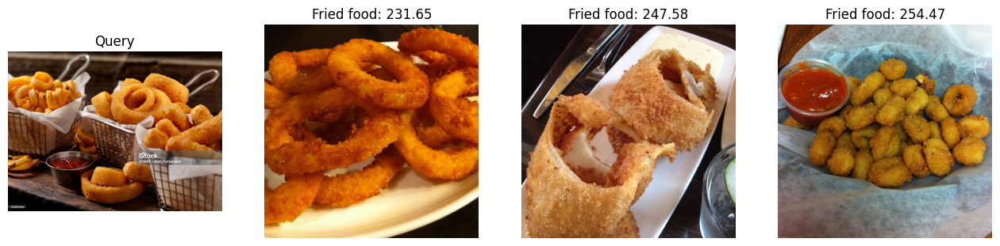

In [45]:
query("https://media.istockphoto.com/id/621849666/ko/%EC%82%AC%EC%A7%84/%EC%96%91%ED%8C%8C-%EB%B0%98%EC%A7%80-%EA%B3%B1%EC%8A%AC-%EA%B0%90%EC%9E%90-%ED%8A%80%EA%B9%80-%EC%B9%98%EC%A6%88-%EC%8A%A4%ED%8B%B1-%EB%B0%94%EA%B5%AC%EB%8B%88.jpg?s=2048x2048&w=is&k=20&c=BaFb-cJyaCIaUUahSgclD67yiTvHtfYxFFo2KCMnpUE=")

{'ids': [['87', '52', '32']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Seafood/7.jpg', 'name': 'Seafood'},
   {'uri': 'test/Meat/2.jpg', 'name': 'Meat'},
   {'name': 'Egg', 'uri': 'test/Egg/2.jpg'}]],
 'distances': [[249.7113037109375, 279.48974609375, 282.9696350097656]]}

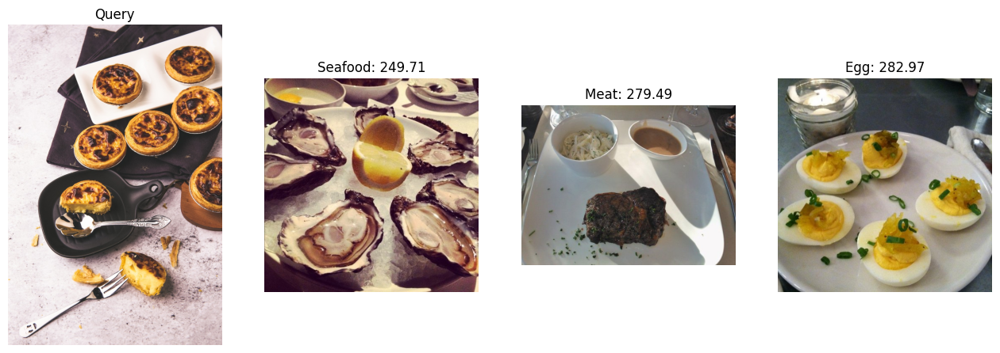

In [46]:
query("https://cdn.pixabay.com/photo/2020/03/17/00/39/food-4938704_1280.jpg")

{'ids': [['6314', '6470', '11055']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Cat/4421.jpg', 'name': 'Cat'},
   {'uri': 'test/Cat/4562.jpg', 'name': 'Cat'},
   {'uri': 'test/Cat/8690.jpg', 'name': 'Cat'}]],
 'distances': [[115.73616027832031, 121.42777252197266, 123.35356140136719]]}

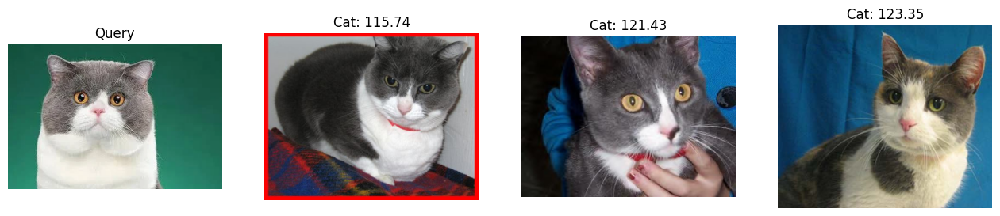

In [104]:
query("https://encrypted-tbn1.gstatic.com/images?q=tbn:ANd9GcSdAH7JE6kBAKtc2kYLYwUkn7SehXs-rj39NQmR18gE62x8tukFixdPqfAd5GVG7HuHukpps6ufxTl4CR3hBeCnTp0y048DeBREsD0w1hCwjA")

{'ids': [['22194', '14697', '23167']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Dog/7448.jpg', 'name': 'Dog'},
   {'uri': 'test/Dog/1195.jpg', 'name': 'Dog'},
   {'name': 'Dog', 'uri': 'test/Dog/8323.jpg'}]],
 'distances': [[156.44027709960938, 170.54425048828125, 181.17245483398438]]}

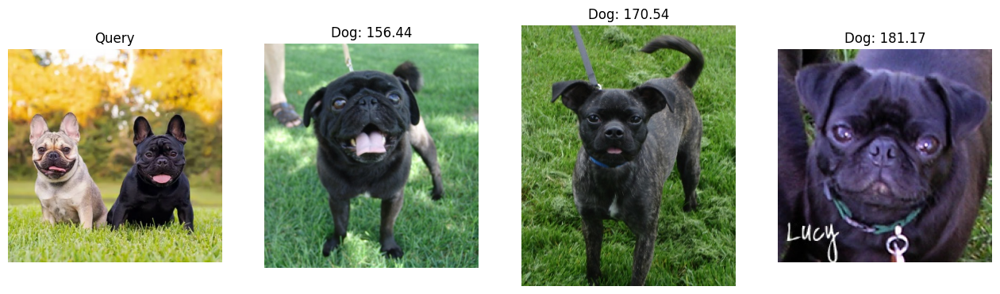

In [102]:
query("https://encrypted-tbn1.gstatic.com/images?q=tbn:ANd9GcQTQDyaETzCPqQtJYVcCOR0r3NIvEj6G7wTahSoMoF-FdBzzse9dY2NqVK1XSC7_a_3ztDq5A0_IaG_kboysg1nODYSlVN4N2Uwc_vypby_yA")

{'ids': [['8987', '11957', '3204']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Cat/6829.jpg', 'name': 'Cat'},
   {'uri': 'test/Cat/9501.jpg', 'name': 'Cat'},
   {'name': 'Cat', 'uri': 'test/Cat/1622.jpg'}]],
 'distances': [[209.0723114013672, 217.61050415039062, 224.55560302734375]]}

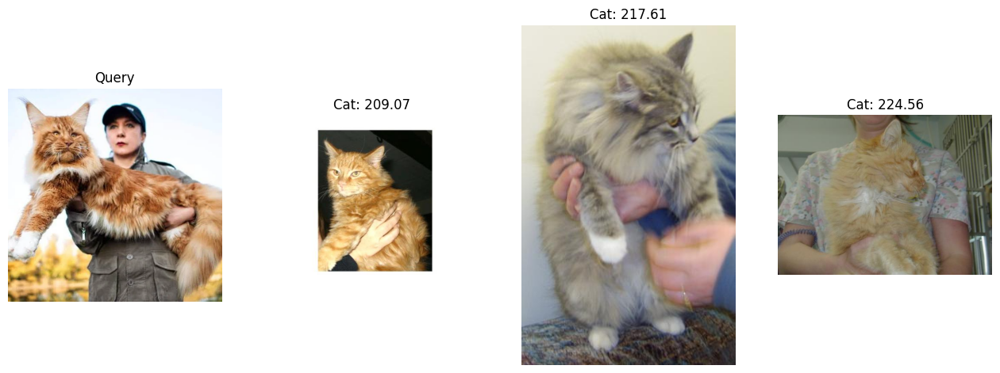

In [105]:
query("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRGw5k7bf97_bPU5jTuh1VHcD4blDEU17-AS1b9mMQfqegLh5q6D3SGAj4XbtF9uRB5STl6mZkZnohSELEsPShITMWtfioruE5qcfIaznOm")

{'ids': [['3798', '10830', '7832']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'name': 'Cat', 'uri': 'test/Cat/2157.jpg'},
   {'name': 'Cat', 'uri': 'test/Cat/8488.jpg'},
   {'uri': 'test/Cat/5789.jpg', 'name': 'Cat'}]],
 'distances': [[75.2424545288086, 81.7501220703125, 82.24162292480469]]}

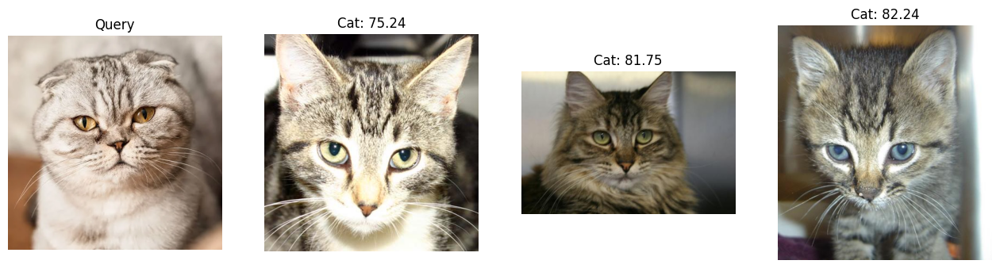

In [107]:
query("https://encrypted-tbn3.gstatic.com/images?q=tbn:ANd9GcQ0ORs5V88T6ykPYChZBdtPaWtOIEqczWbiRP2VhKAA9jF284gf2nDULXnSbKOZPCk0Om9EU8pSj0e4exv0SiSTR7saSq_SDEKWjcjsi5BK")

{'ids': [['4122', '7672', '11584']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'uri': 'test/Cat/2449.jpg', 'name': 'Cat'},
   {'name': 'Cat', 'uri': 'test/Cat/5644.jpg'},
   {'uri': 'test/Cat/9166.jpg', 'name': 'Cat'}]],
 'distances': [[69.62867736816406, 69.80381774902344, 76.72007751464844]]}

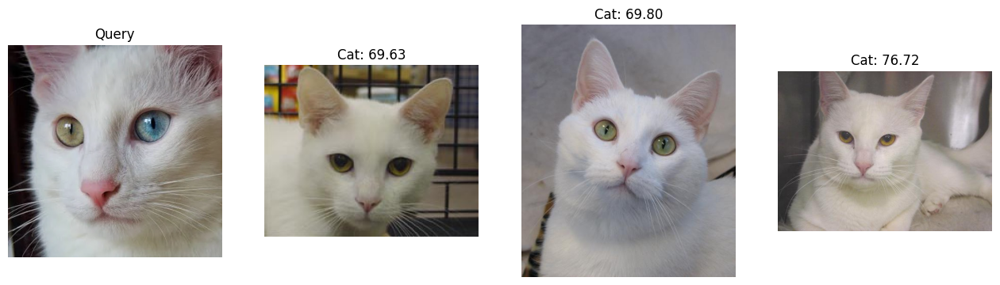

In [108]:
query("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQgmwrpxVCAuhRiGCjc_EqU69-jRzkPHIpJ6kR7U0Ntb2FtX5x5Y23NuoI9XevxMd2U4lM_zrdsVOYXM-3XJJb_KpnIx78k77YIeuucd2kh")

{'ids': [['6468', '110', '8766']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'name': 'Cat', 'uri': 'test/Cat/4560.jpg'},
   {'uri': 'test/Cat/10087.jpg', 'name': 'Cat'},
   {'uri': 'test/Cat/6629.jpg', 'name': 'Cat'}]],
 'distances': [[119.494873046875, 121.30284118652344, 131.8060302734375]]}

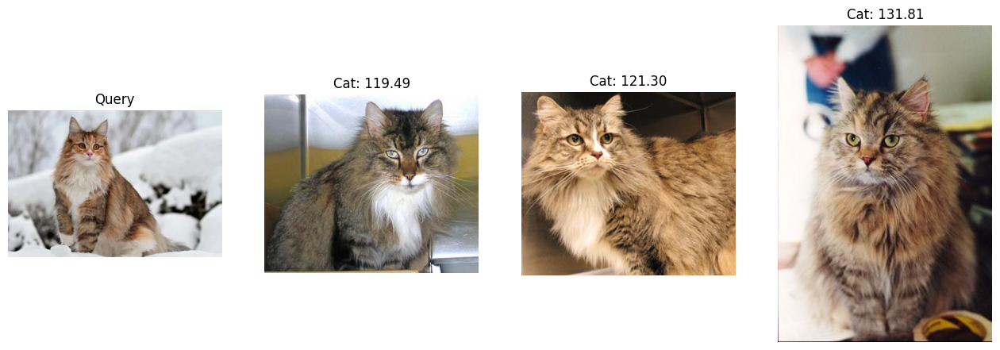

In [109]:
query("https://encrypted-tbn1.gstatic.com/images?q=tbn:ANd9GcQQ-AckapCgSskOP-dR76NwhG7N-5W7ca_-mFRDCFypyToTToDwRiQ88lkVSbyXbHT1kAuwl9J9MofBCRj3j1ymYAsYqnQPbNfu-eX5LgP9")

{'ids': [['17120', '23873', '15599']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'name': 'Dog', 'uri': 'test/Dog/2881.jpg'},
   {'name': 'Dog', 'uri': 'test/Dog/896.jpg'},
   {'name': 'Dog', 'uri': 'test/Dog/1511.jpg'}]],
 'distances': [[130.3538055419922, 136.43153381347656, 136.4796600341797]]}

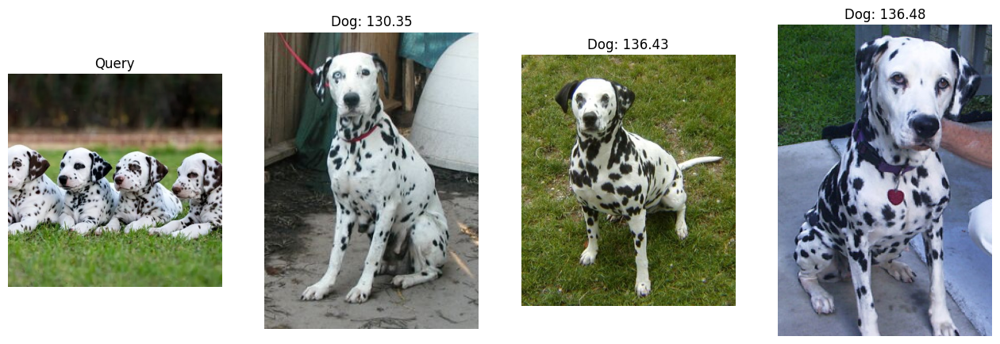

In [110]:
query("https://encrypted-tbn3.gstatic.com/images?q=tbn:ANd9GcRH3xyv3suDQbG-7k0DLyBHu-LXyWMgcKQuF81iO2v8VgEikVf2ZQaX2XQlnAC4GuF-RLlpBhX9smSyCagsQKoxEX1HB1S-H1_ZcrtOFOA7iQ")

{'ids': [['14990', '14942', '23718']],
 'embeddings': None,
 'documents': [[None, None, None]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'name': 'Dog', 'uri': 'test/Dog/12212.jpg'},
   {'uri': 'test/Dog/1217.jpg', 'name': 'Dog'},
   {'name': 'Dog', 'uri': 'test/Dog/882.jpg'}]],
 'distances': [[98.87074279785156, 131.97433471679688, 132.11087036132812]]}

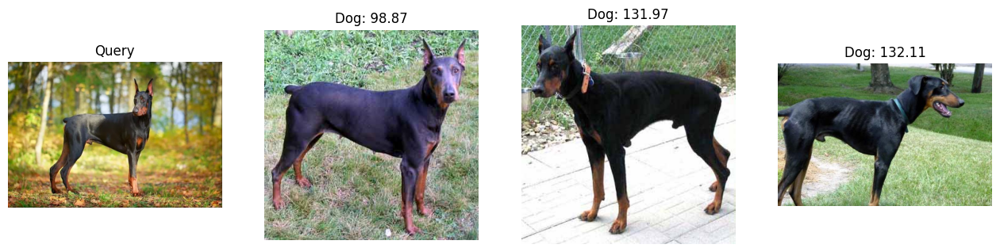

In [111]:
query("https://encrypted-tbn3.gstatic.com/images?q=tbn:ANd9GcSlNTvGa6fNZZruBKbdBM5E6BdYyO8RrIYFcb8rWbgx5Ch7NdwXX-fEQDj4uRieYcTh1x_N6cVGNM163Ieahm_m8MiHoRkC6c-dRQDuXxJd")